# Run Stable Diffusion 3.5 models

Ensure to have the following packages installed before running this notebook for saving time to install packages one by one.
```sh
accelerate
bitsandbytes
protobuf
transformers
diffusers
sentencepiece
```

In [1]:
# import packages
import torch
from transformers import BitsAndBytesConfig
from diffusers import (
    SD3Transformer2DModel
    ,StableDiffusion3Pipeline
)
import gc

# settings
device = "cuda:0"
prompt = "4k, best quality, beautiful 20 years girl, show hands and fingers"

def get_sd35_pipe(model_path:str):
    return StableDiffusion3Pipeline.from_pretrained(
        model_path
        , torch_dtype           = torch.bfloat16
    )

def get_sd35_quant_pipe(
    model_path:str
    , bit_type = "8bit"
):
    '''
    Function to get pipe
    '''
    if bit_type == "8bit":
        nf_config = BitsAndBytesConfig(load_in_8bit = True)
        sd35_nf = SD3Transformer2DModel.from_pretrained(
            model_path
            , subfolder             = "transformer"
            , quantization_config   = nf_config
            , torch_dtype           = torch.bfloat16
        )
    elif bit_type == "4bit":
        nf_config = BitsAndBytesConfig(
            load_in_4bit                = True
            , bnb_4bit_quant_type       = "nf4"
            , bnb_4bit_compute_dtype    = torch.bfloat16
        )
        sd35_nf = SD3Transformer2DModel.from_pretrained(
            model_path
            , subfolder           = "transformer"
            , quantization_config = nf_config
            , torch_dtype         = torch.bfloat16
        )
    
    sd35_pipe = StableDiffusion3Pipeline.from_pretrained(
        model_path
        , transformer           = sd35_nf
        , torch_dtype           = torch.bfloat16
    )
    return sd35_pipe

def run_sd_pipe(pipe:StableDiffusion3Pipeline, prompt:str, seed:int=7):
    '''
    All models reuse this function to avoid writing duplicated code
    '''
    pipe.to(device)
    
    neg_prompt = "low quality, blur"

    image = pipe(
        prompt              = prompt
        , negative_prompt   = neg_prompt
        , generator = torch.Generator(device).manual_seed(seed)
    ).images[0]
    display(image)

    pipe.to('cpu')
    gc.collect()
    torch.cuda.empty_cache()



/home/andrewzhu/storage_1t_1/az_git_folder/az_samples/samplecode_venv_p310/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Stable Diffusion 3.5 Large

For 24G VRAM GPU like RTX 3090 or RTX 4090, Have to quantize model to 4 or 8 bit before running.

### SD35 large 8-bit quantization

In [ ]:
model_path = "/home/andrewzhu/storage_14t_5/ai_models_all/sd_hf_models/stabilityai/stable-diffusion-3.5-large_main"
# or model_path = "stabilityai/stable-diffusion-3.5-large"

pipe = get_sd35_quant_pipe(
    model_path = model_path
    , bit_type = "8bit"
)

Loading pipeline components...: 100%|██████████| 9/9 [01:05<00:00,  7.31s/it]


Since the quantizing will move the transformer model to VRAM, no need to manually move it to CUDA, generate images and then release the VRAM.

The module 'SD3Transformer2DModel' has been loaded in `bitsandbytes` 8bit and moving it to cuda:0 via `.to()` is not supported. Module is still on cuda:0.
  0%|          | 0/28 [00:00<?, ?it/s]/home/andrewzhu/storage_1t_1/az_git_folder/az_samples/samplecode_venv_p310/lib/python3.10/site-packages/bitsandbytes/autograd/_functions.py:316: UserWarning: MatMul8bitLt: inputs will be cast from torch.bfloat16 to float16 during quantization
  warnings.warn(f"MatMul8bitLt: inputs will be cast from {A.dtype} to float16 during quantization")
100%|██████████| 28/28 [00:21<00:00,  1.31it/s]


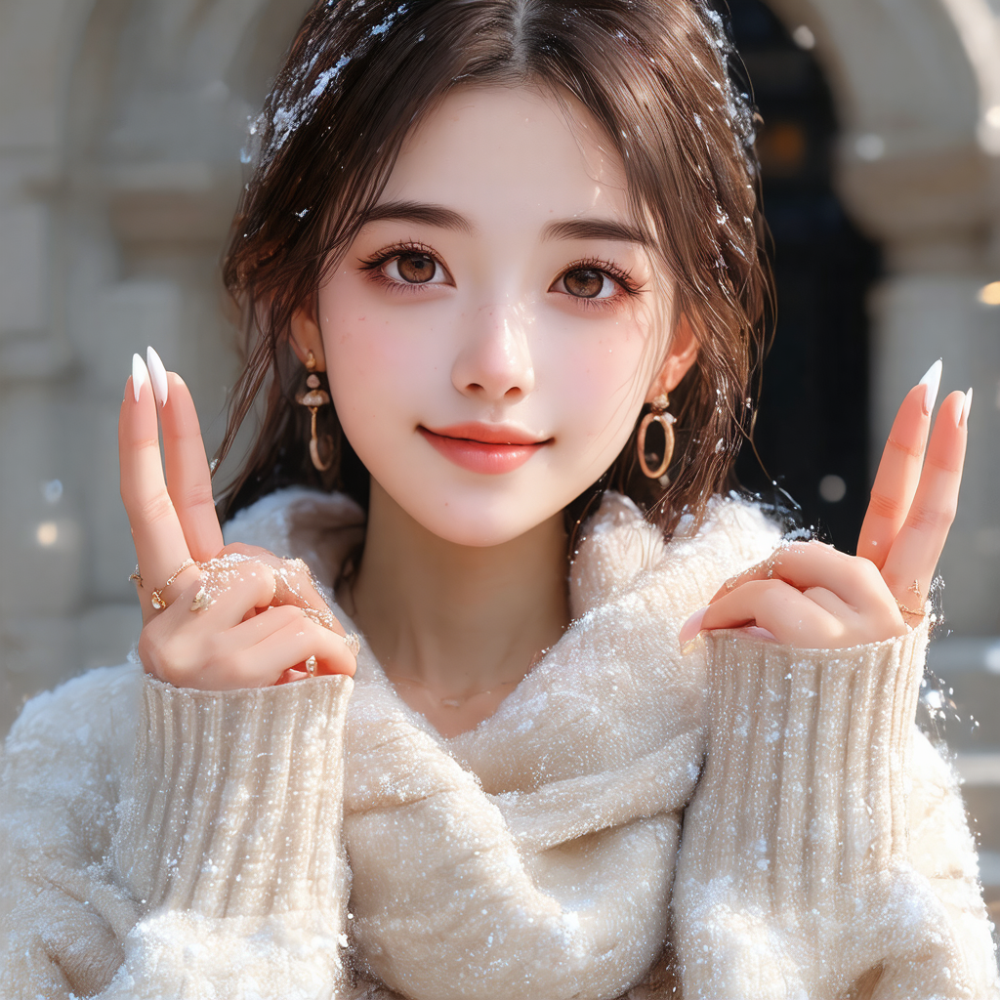

The module 'SD3Transformer2DModel' has been loaded in `bitsandbytes` 8bit and moving it to cpu via `.to()` is not supported. Module is still on cuda:0.


In [3]:
run_sd_pipe(
    pipe        = pipe
    , prompt    = prompt
    , seed      = 7
)

Alas, SD 3.5 still gets problems with fingers. This 8-bit model will use around 21G VRAM, now let's see how much VRAM will be used by 4-bit model. Please restart this notebook to release the occupied VRAM before running the following code.

### SD35 large 4-bit quantization

In [ ]:
model_path = "/home/andrewzhu/storage_14t_5/ai_models_all/sd_hf_models/stabilityai/stable-diffusion-3.5-large_main"
pipe = get_sd35_quant_pipe(
    model_path = model_path
    , bit_type = "4bit"
)

Loading pipeline components...: 100%|██████████| 9/9 [00:02<00:00,  4.18it/s]


100%|██████████| 28/28 [00:16<00:00,  1.73it/s]


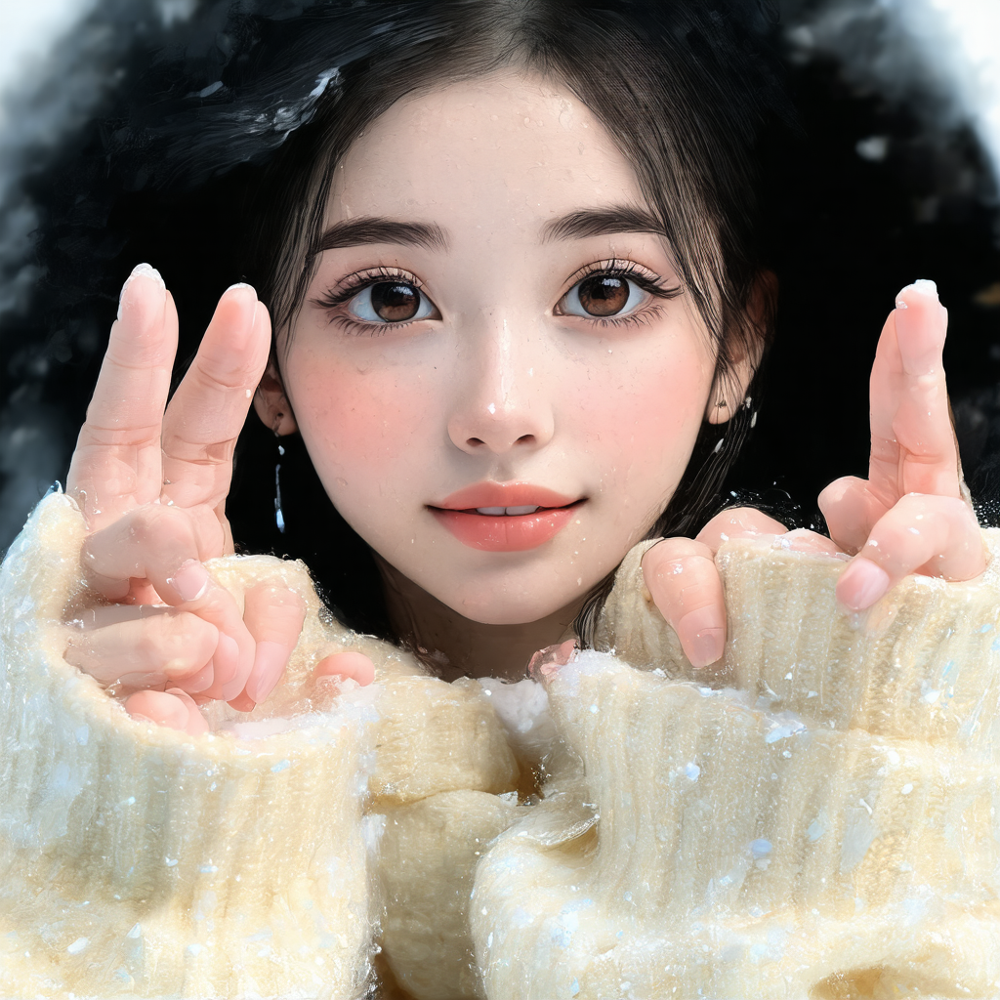

In [3]:
run_sd_pipe(
    pipe        = pipe
    , prompt    = prompt
    , seed      = 7
)

The 4-bit quantizing output a very different result compare with the 8-bit version. Face and overall aesthetics is good, but the hand and fingers, are still a mess.

## Stable Diffusion 3.5 Large Turbo

### SD35 Large Turbo 8-bit
Let's see the output of SD 3.5 large turbo version, in 8bit.

In [2]:
model_path = "/home/andrewzhu/storage_14t_5/ai_models_all/sd_hf_models/stabilityai/stable-diffusion-3.5-large-turbo_main"
pipe = get_sd35_quant_pipe(
    model_path = model_path
    , bit_type = "8bit"
)

Loading pipeline components...: 100%|██████████| 9/9 [00:02<00:00,  4.42it/s]


The module 'SD3Transformer2DModel' has been loaded in `bitsandbytes` 8bit and moving it to cuda:0 via `.to()` is not supported. Module is still on cuda:0.
  0%|          | 0/28 [00:00<?, ?it/s]/home/andrewzhu/storage_1t_1/az_git_folder/az_samples/samplecode_venv_p310/lib/python3.10/site-packages/bitsandbytes/autograd/_functions.py:316: UserWarning: MatMul8bitLt: inputs will be cast from torch.bfloat16 to float16 during quantization
  warnings.warn(f"MatMul8bitLt: inputs will be cast from {A.dtype} to float16 during quantization")
100%|██████████| 28/28 [00:21<00:00,  1.31it/s]


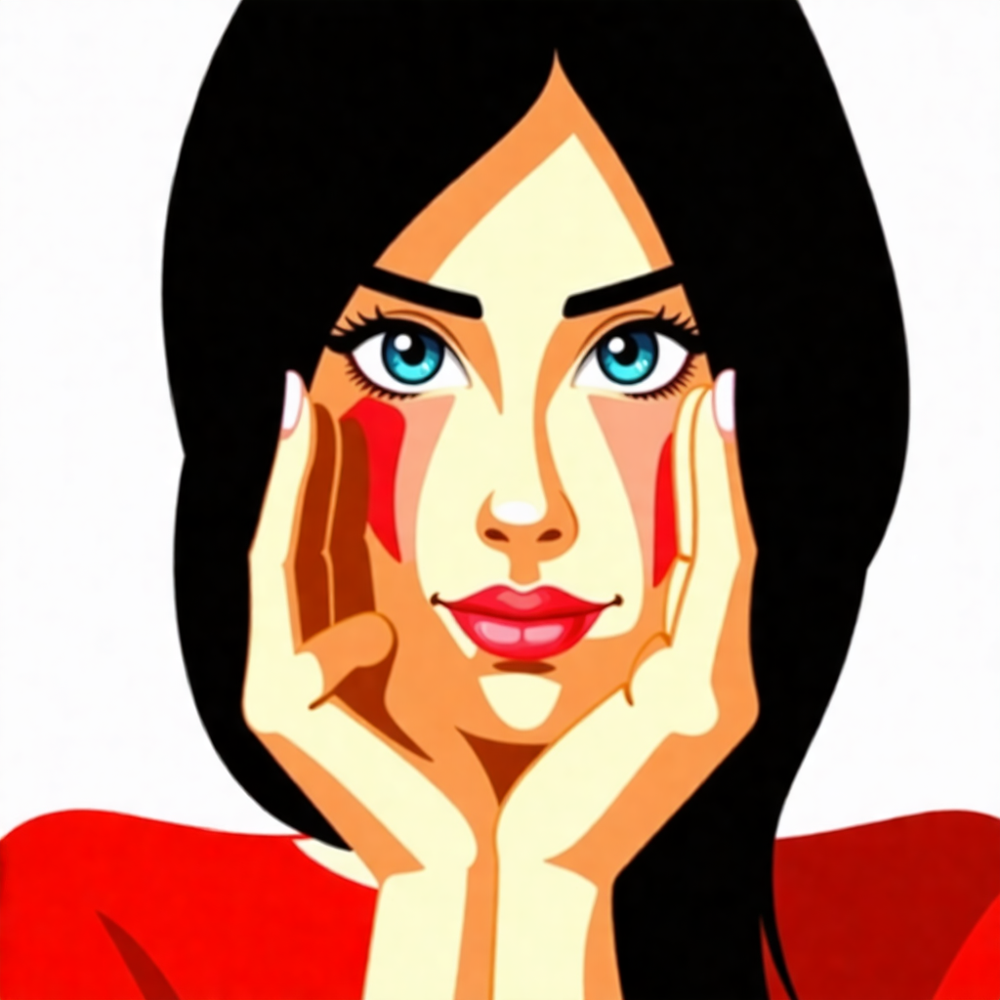

The module 'SD3Transformer2DModel' has been loaded in `bitsandbytes` 8bit and moving it to cpu via `.to()` is not supported. Module is still on cuda:0.


In [4]:
run_sd_pipe(
    pipe        = pipe
    , prompt    = prompt
    , seed      = 7
)

The 8bit result is bad, really really bad. How about 4bit? 

### SD35 Large Turbo 4-bit

In [2]:
model_path = "/home/andrewzhu/storage_14t_5/ai_models_all/sd_hf_models/stabilityai/stable-diffusion-3.5-large-turbo_main"
pipe = get_sd35_quant_pipe(
    model_path = model_path
    , bit_type = "4bit"
)

Loading pipeline components...: 100%|██████████| 9/9 [00:02<00:00,  4.20it/s]


100%|██████████| 28/28 [00:16<00:00,  1.73it/s]


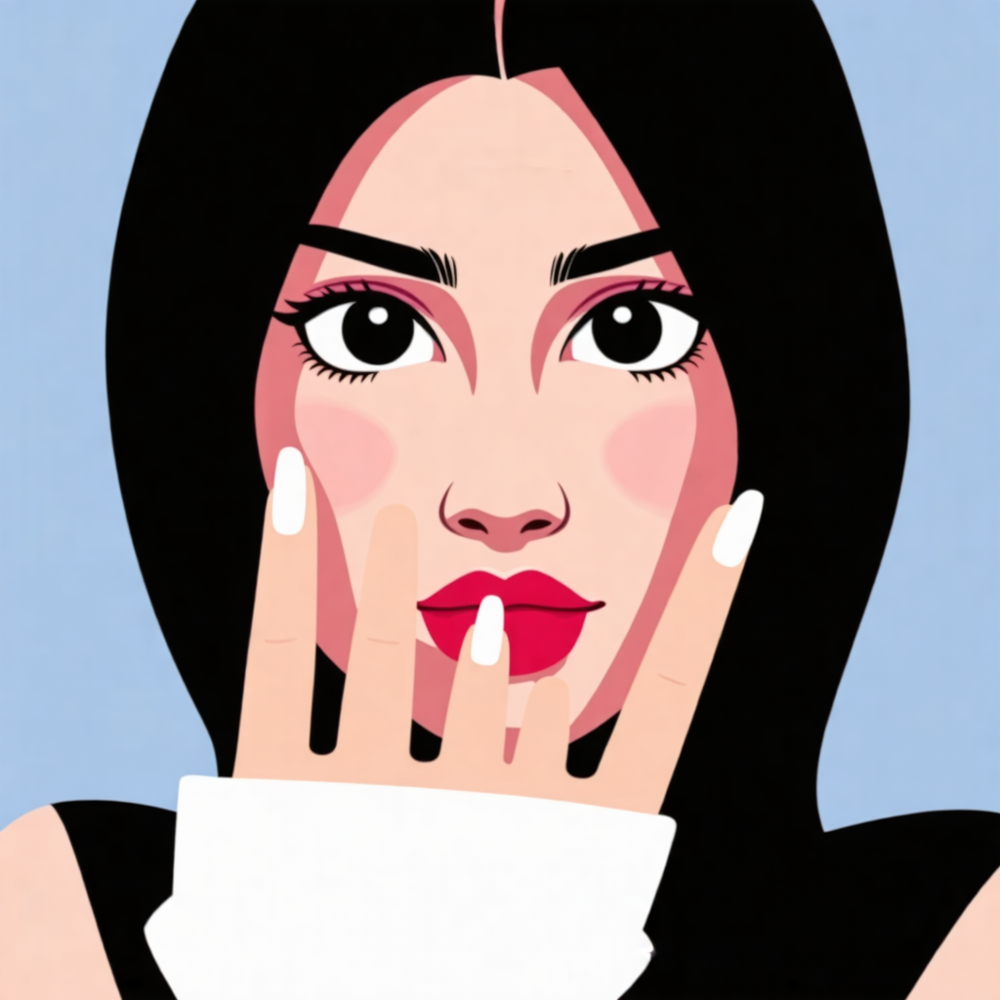

In [3]:
run_sd_pipe(
    pipe        = pipe
    , prompt    = prompt
    , seed      = 7
)

Really not very good.

## Stable Diffusion 3.5 Medium

### SD 35 Medium bf16

In [5]:
model_path  = "/home/andrewzhu/storage_14t_5/ai_models_all/sd_hf_models/stabilityai/stable-diffusion-3.5-medium_main"
pipe = get_sd35_pipe(model_path=model_path)

Loading pipeline components...: 100%|██████████| 9/9 [01:13<00:00,  8.14s/it]


100%|██████████| 28/28 [00:05<00:00,  4.72it/s]


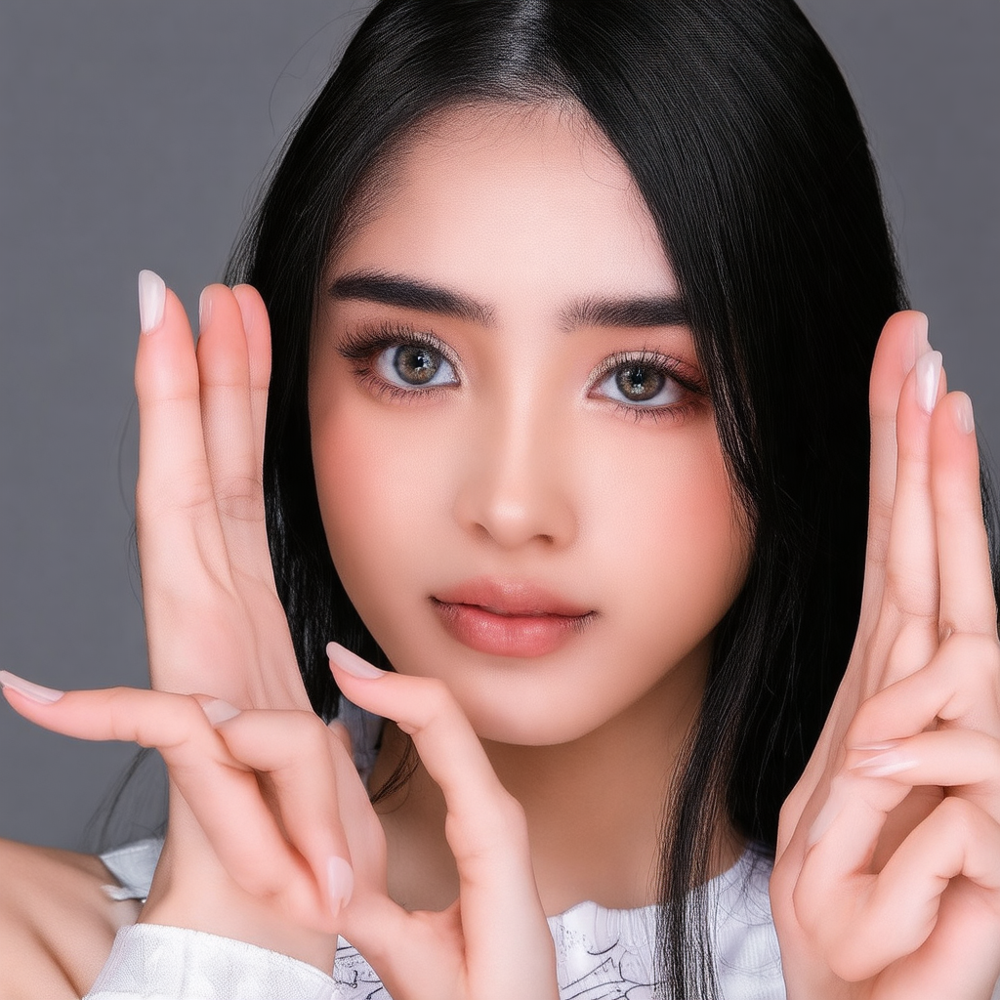

In [6]:
run_sd_pipe(
    pipe = pipe
    , prompt = prompt
    , seed = 7
)

Face is acceptable, but fingers, hmmm

### SD 35 Medium 8-bit

Loading pipeline components...: 100%|██████████| 9/9 [00:03<00:00,  2.57it/s]
The module 'SD3Transformer2DModel' has been loaded in `bitsandbytes` 8bit and moving it to cuda:0 via `.to()` is not supported. Module is still on cuda:0.
  0%|          | 0/28 [00:00<?, ?it/s]/home/andrewzhu/storage_1t_1/az_git_folder/az_samples/samplecode_venv_p310/lib/python3.10/site-packages/bitsandbytes/autograd/_functions.py:316: UserWarning: MatMul8bitLt: inputs will be cast from torch.bfloat16 to float16 during quantization
  warnings.warn(f"MatMul8bitLt: inputs will be cast from {A.dtype} to float16 during quantization")
100%|██████████| 28/28 [00:10<00:00,  2.75it/s]


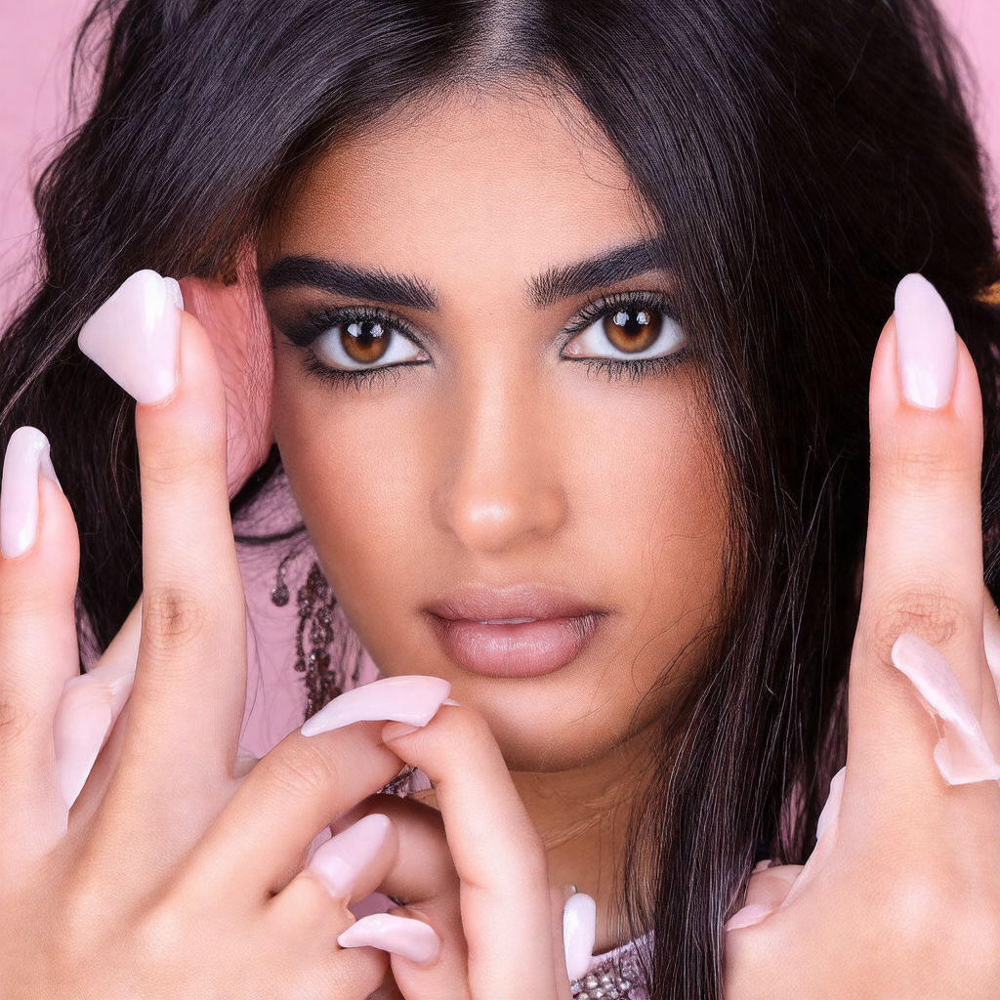

The module 'SD3Transformer2DModel' has been loaded in `bitsandbytes` 8bit and moving it to cpu via `.to()` is not supported. Module is still on cuda:0.


In [7]:
model_path  = "/home/andrewzhu/storage_14t_5/ai_models_all/sd_hf_models/stabilityai/stable-diffusion-3.5-medium_main"
pipe = get_sd35_quant_pipe(model_path=model_path, bit_type="8bit")
run_sd_pipe(
    pipe = pipe
    , prompt = prompt
    , seed = 7
)

8bit is Even worse.

### SD 35 Medium 4-bit

100%|██████████| 28/28 [00:06<00:00,  4.65it/s]


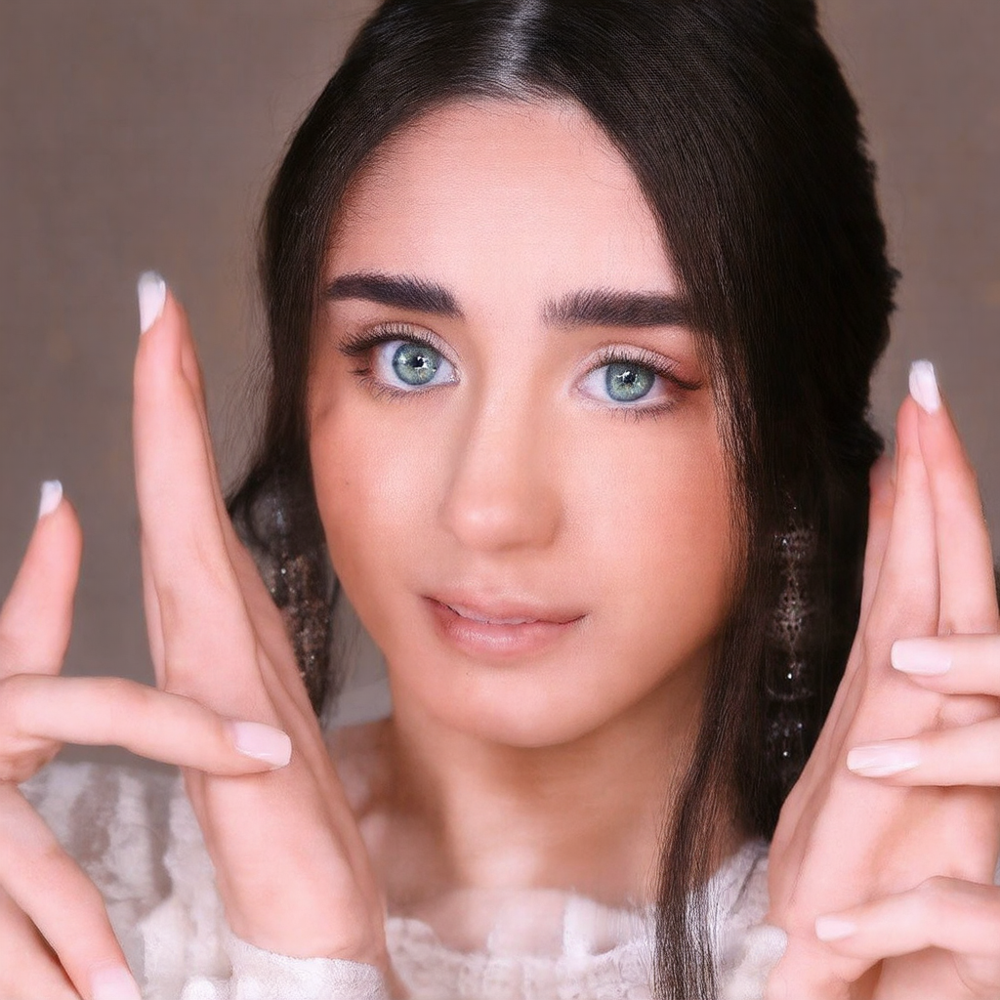

In [2]:
model_path  = "/home/andrewzhu/storage_14t_5/ai_models_all/sd_hf_models/stabilityai/stable-diffusion-3.5-medium_main"
pipe = get_sd35_quant_pipe(model_path=model_path, bit_type="4bit")
run_sd_pipe(
    pipe = pipe
    , prompt = prompt
    , seed = 7
)

This is Unacceptable.